In [2]:
import json
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import IPython.display as ipd
import librosa

from plot_utils import plot_sample_from_rttm, prepare_gen_segment_table, generate_vad_segment_table_per_tensor, load_tensor_from_file, gen_pred_from_speech_segments

def load_manifest(manifest_file):
    results = {}
    with Path(manifest_file).open("r") as fin:
        for line in fin.readlines():
            item = json.loads(line.strip())
            audio_file = item["audio_filepath"]
            key = Path(audio_file).stem
            results[key] = audio_file
    return results

def load_offset(manifest_file):
    results = {}
    with Path(manifest_file).open("r") as fin:
        for line in fin.readlines():
            item = json.loads(line.strip())
            audio_file = item["audio_filepath"]
            key = Path(audio_file).stem
            results[key] = item.get("offset", 0.0)
    return results

def load_frames(data_dir):
    results = {}
    for frames_file in Path(data_dir).glob("*.frame"):
        key = frames_file.stem
        results[key] = str(frames_file)
    return results

def plot_sample(
    path2audio_file: str,
    path2_vad_pred: str,
    path2ground_truth_label: str = None,
    offset: float = 0,
    duration: float = None,
    threshold: float = None,
    per_args: dict = None,
    save_path: str = '',
    label_repeat: int = 1,
    unit_frame_len: float = 0.01,
    use_label_offset: bool = False,
) -> ipd.Audio:
    """
    Plot VAD outputs for demonstration in tutorial
    Args:
        path2audio_file (str):  path to audio file.
        path2_vad_pred (str): path to vad prediction file,
        path2ground_truth_label(str): path to groundtruth label file.
        threshold (float): threshold for prediction score (from 0 to 1).
        per_args(dict): a dict that stores the thresholds for postprocessing.
    """
    plt.figure(figsize=[20, 2])
    UNIT_FRAME_LEN = unit_frame_len

    audio, sample_rate = librosa.load(path=path2audio_file, sr=16000, mono=True, offset=offset, duration=duration)
    dur = librosa.get_duration(y=audio, sr=sample_rate)

    time = np.arange(offset, offset + dur, UNIT_FRAME_LEN)
    frame, _ = load_tensor_from_file(path2_vad_pred)

    # frame_snippet = frame[int(offset / UNIT_FRAME_LEN) : int((offset + dur) / UNIT_FRAME_LEN)]
    frame_snippet = frame[: int(dur / UNIT_FRAME_LEN)]
    len_pred = len(frame_snippet)
    ax1 = plt.subplot()
    ax1.set_title(path2audio_file)
    ax1.plot(np.arange(audio.size) / sample_rate, audio, 'gray')
    # ax1.set_xticks(time)
    # ax1.set_xlim([int(offset), int(offset+dur) + 1])
    ax1.tick_params(axis='y', labelcolor='b')
    ax1.set_ylabel('Signal')
    ax1.set_ylim([-1, 1])
    ax2 = ax1.twinx()

    if threshold and per_args:
        raise ValueError("threshold and per_args cannot be used at same time!")
    if not threshold and not per_args:
        raise ValueError("One and only one of threshold and per_args must have been used!")

    if threshold:
        pred_snippet = np.where(frame_snippet >= threshold, 1, 0)
    if per_args:
        _, per_args_float = prepare_gen_segment_table(
            frame, per_args
        )  # take whole frame here for calculating onset and offset
        speech_segments = generate_vad_segment_table_per_tensor(frame, per_args_float, UNIT_FRAME_LEN)
        pred = gen_pred_from_speech_segments(speech_segments, frame, UNIT_FRAME_LEN)
        pred_snippet = pred[: int(dur / UNIT_FRAME_LEN)]

    if path2ground_truth_label:
        # label = extract_labels(path2ground_truth_label, time)
        label, _ = load_tensor_from_file(path2ground_truth_label)
        if label_repeat > 1:
            label = np.repeat(label.numpy(), label_repeat)
        if use_label_offset:
            label = label[ : len_pred]
        else:
            label = label[:len_pred]
        ax2.plot(np.arange(len_pred) * UNIT_FRAME_LEN, label, 'r', label='label')

    ax2.plot(np.arange(len_pred) * UNIT_FRAME_LEN, pred_snippet, 'b', label='pred')
    ax2.plot(np.arange(len_pred) * UNIT_FRAME_LEN, frame_snippet, 'g--', label='speech prob')
    ax2.tick_params(axis='y', labelcolor='r')
    ax2.legend(loc='lower right', shadow=True)
    ax2.set_ylabel('Preds and Probas')
    ax2.set_ylim([-0.1, 1.1])
    ax2.set_xticks(np.arange(0, int(dur) + 1, 1))
    plt.show()
    if save_path != "":
        plt.savefig(save_path)
    return ipd.Audio(audio, rate=16000)


[NeMo W 2023-03-25 13:11:12 optimizers:55] Apex was not found. Using the lamb or fused_adam optimizer will error out.
[NeMo W 2023-03-25 13:11:13 nemo_logging:349] /home/heh/anaconda3/envs/debug/lib/python3.8/site-packages/torch/jit/annotations.py:296: UserWarning: TorchScript will treat type annotations of Tensor dtype-specific subtypes as if they are normal Tensors. dtype constraints are not enforced in compilation either.
      warnings.warn("TorchScript will treat type annotations of Tensor "
    


In [37]:
exp_dir3 = "drc_marblenet_3x2x64_Mixed_sgdlr1e-2minlr1e-4_wd1e-3_aug10x0.05_b64_ep50_synth1k_s2_wce_fnorm_n4"
root_dir3 = Path("/media/data/projects/NeMo-fvad/vad_code/nemo_experiments/Frame_VAD") / exp_dir3 / "frame_vad_multi_output_sd_dev"
# situation = "clinical"
test_folder3 = root_dir3 / "vad_output_mixer6-dev.mc_split" # Path(f"vad_output_dh3_dev_{situation}_manifest")

manifest_file3 = test_folder3 / Path("manifest_vad_input.json")
pred_frame_dir3 = test_folder3 / Path("frames_predictions")
gt_frame_dir3 = test_folder3 / Path("frames_groundtruth")

audio_dict3 = load_manifest(manifest_file3)
pred_frame_dict3 = load_frames(pred_frame_dir3)
gt_frame_dict3 = load_frames(gt_frame_dir3)
offset_dict3 = load_offset(manifest_file3)
print(len(audio_dict3), len(pred_frame_dict3), len(gt_frame_dict3))

767 767 767


20090914_125705_LDC_120354_CH02
/media/data/projects/NeMo-fvad/vad_code/tools/20090914_125705_LDC_120354_CH02.wav


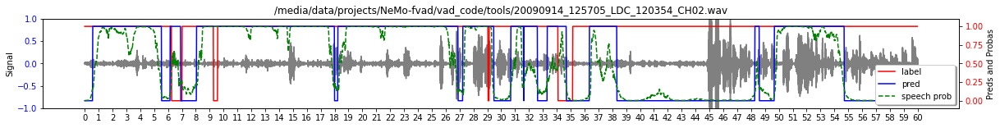

In [57]:
post_args = {
    "onset": 0.3, # onset threshold for detecting the beginning and end of a speech
    "offset": 0.3, # offset threshold for detecting the end of a speech.
    "pad_onset": 0.1, # adding durations before each speech segment
    "pad_offset": 0.1, # adding durations after each speech segment
    "min_duration_on": 0.0, # threshold for small non_speech deletion
    "min_duration_off": 0.0, # threshold for short speech segment deletion
    "filter_speech_first": True, 
    "frame_length_in_sec": 0.02, 
}
duration = 60
unit_frame_len = 0.02
all_keys3 = sorted(list(audio_dict3.keys()))
# key = str(np.random.choice(all_keys3, 1)[0])
key = "20090914_125705_LDC_120354_CH02"
offset = offset_dict3[key]
print(key)
print(audio_dict3[key])
plot_sample(audio_dict3[key], pred_frame_dict3[key], gt_frame_dict3[key],
            per_args=post_args, offset=offset,duration=duration, unit_frame_len=unit_frame_len)


In [23]:
from pydub import AudioSegment

def match_target_amplitude(sound, target_dBFS):
    change_in_dBFS = target_dBFS - sound.dBFS
    return sound.apply_gain(change_in_dBFS)

sound = AudioSegment.from_file(audio_dict3[key])
print(sound.dBFS)
normalized_sound = match_target_amplitude(sound, -20.0)
# normalized_sound = normalized_sound / abs(max(normalized_sound))
output_file = "./20090914_125705_LDC_120354_CH02.wav"
normalized_sound.export(output_file, format="wav")
audio3, _ = librosa.load(path=output_file, sr=16000, mono=True, offset=offset, duration=duration)


-49.481144996029855


1 1 1
20090914_125705_LDC_120354_CH02
/media/data2/chime7-challenge/datasets/mixer6/audio/dev/20090914_125705_LDC_120354_CH02.wav


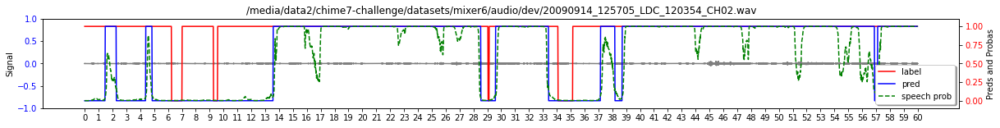

In [4]:
exp_dir3 = "drc_marblenet_3x2x64_Mixed_sgdlr1e-2minlr1e-4_wd1e-3_aug10x0.05_b64_ep50_synth1k_s2_wce_fnorm_n4"
root_dir3 = Path("/media/data/projects/NeMo-fvad/vad_code/nemo_experiments/Frame_VAD") / exp_dir3 / "frame_vad_multi_output_chime_debug"
# situation = "clinical"
test_folder3 = root_dir3 / "vad_output_mixer6-debug2" # Path(f"vad_output_dh3_dev_{situation}_manifest")

manifest_file3 = test_folder3 / Path("manifest_vad_input.json")
pred_frame_dir3 = test_folder3 / Path("frames_predictions")
gt_frame_dir3 = test_folder3 / Path("frames_groundtruth")

audio_dict3 = load_manifest(manifest_file3)
pred_frame_dict3 = load_frames(pred_frame_dir3)
gt_frame_dict3 = load_frames(gt_frame_dir3)
offset_dict3 = load_offset(manifest_file3)
print(len(audio_dict3), len(pred_frame_dict3), len(gt_frame_dict3))
post_args = {
    "onset": 0.3, # onset threshold for detecting the beginning and end of a speech
    "offset": 0.3, # offset threshold for detecting the end of a speech.
    "pad_onset": 0.1, # adding durations before each speech segment
    "pad_offset": 0.1, # adding durations after each speech segment
    "min_duration_on": 0.0, # threshold for small non_speech deletion
    "min_duration_off": 0.0, # threshold for short speech segment deletion
    "filter_speech_first": True, 
    "frame_length_in_sec": 0.02, 
}
duration = 60
unit_frame_len = 0.02
all_keys3 = sorted(list(audio_dict3.keys()))
key = str(np.random.choice(all_keys3, 1)[0])
# key = "20090722_154451_LDC_120225_CH08"
offset = offset_dict3[key]
print(key)
print(audio_dict3[key])
plot_sample(audio_dict3[key], pred_frame_dict3[key], gt_frame_dict3[key],
            per_args=post_args, offset=offset,duration=duration, unit_frame_len=unit_frame_len, use_label_offset=False)


1 1 1
20090914_125705_LDC_120354_CH02
/media/data/projects/NeMo-fvad/vad_code/tools/20090914_125705_LDC_120354_CH02.wav


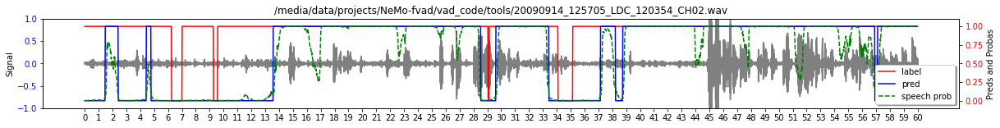

In [5]:
exp_dir3 = "drc_marblenet_3x2x64_Mixed_sgdlr1e-2minlr1e-4_wd1e-3_aug10x0.05_b64_ep50_synth1k_s2_wce_fnorm_n4"
root_dir3 = Path("/media/data/projects/NeMo-fvad/vad_code/nemo_experiments/Frame_VAD") / exp_dir3 / "frame_vad_multi_output_chime_debug"
# situation = "clinical"
test_folder3 = root_dir3 / "vad_output_mixer6-debug" # Path(f"vad_output_dh3_dev_{situation}_manifest")

manifest_file3 = test_folder3 / Path("manifest_vad_input.json")
pred_frame_dir3 = test_folder3 / Path("frames_predictions")
gt_frame_dir3 = test_folder3 / Path("frames_groundtruth")

audio_dict3 = load_manifest(manifest_file3)
pred_frame_dict3 = load_frames(pred_frame_dir3)
gt_frame_dict3 = load_frames(gt_frame_dir3)
offset_dict3 = load_offset(manifest_file3)
print(len(audio_dict3), len(pred_frame_dict3), len(gt_frame_dict3))
post_args = {
    "onset": 0.3, # onset threshold for detecting the beginning and end of a speech
    "offset": 0.3, # offset threshold for detecting the end of a speech.
    "pad_onset": 0.1, # adding durations before each speech segment
    "pad_offset": 0.1, # adding durations after each speech segment
    "min_duration_on": 0.0, # threshold for small non_speech deletion
    "min_duration_off": 0.0, # threshold for short speech segment deletion
    "filter_speech_first": True, 
    "frame_length_in_sec": 0.02, 
}
duration = 60
unit_frame_len = 0.02
all_keys3 = sorted(list(audio_dict3.keys()))
key = str(np.random.choice(all_keys3, 1)[0])
# key = "20090722_154451_LDC_120225_CH08"
offset = offset_dict3[key]
print(key)
print(audio_dict3[key])
plot_sample(audio_dict3[key], pred_frame_dict3[key], gt_frame_dict3[key],
            per_args=post_args, offset=offset,duration=duration, unit_frame_len=unit_frame_len, use_label_offset=False)


1 1 1
20090914_125705_LDC_120354_CH02
/media/data2/chime7-challenge/datasets/mixer6/audio/dev/20090914_125705_LDC_120354_CH02.wav


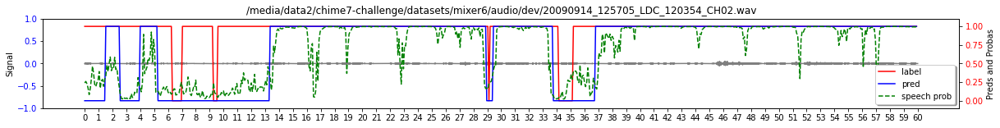

In [6]:
# exp_dir3 = "drc_marblenet_3x2x64_Mixed_sgdlr1e-2minlr1e-4_wd1e-3_aug10x0.05_b64_ep50_synth1k_s2_wce_fnorm_n4"
# root_dir3 = Path("/media/data/projects/NeMo-fvad/vad_code/nemo_experiments/Frame_VAD") / exp_dir3 / "frame_vad_multi_output_chime_debug"
# situation = "clinical"
test_folder3 = Path("/media/data/projects/NeMo-fvad/vad_code/nemo_experiments/segment_vad_multi_output/vad_output_mixer6-debug2")

manifest_file3 = test_folder3 / Path("manifest_vad_input.json")
pred_frame_dir3 = test_folder3 / Path("frames_predictions")
gt_frame_dir3 = test_folder3 / Path("frames_groundtruth")

audio_dict3 = load_manifest(manifest_file3)
pred_frame_dict3 = load_frames(pred_frame_dir3)
gt_frame_dict3 = load_frames(gt_frame_dir3)
offset_dict3 = load_offset(manifest_file3)
print(len(audio_dict3), len(pred_frame_dict3), len(gt_frame_dict3))

post_args = {
    "onset": 0.5, # onset threshold for detecting the beginning and end of a speech
    "offset": 0.3, # offset threshold for detecting the end of a speech.
    "pad_onset": 0.2, # adding durations before each speech segment
    "pad_offset": 0.2, # adding durations after each speech segment
    "min_duration_on": 0.0, # threshold for small non_speech deletion
    "min_duration_off": 0.0, # threshold for short speech segment deletion
    "filter_speech_first": True, 
    "frame_length_in_sec": 0.08, 
}
duration = 60
unit_frame_len = 0.08
all_keys3 = sorted(list(audio_dict3.keys()))
key = str(np.random.choice(all_keys3, 1)[0])
# key = "20090722_154451_LDC_120225_CH08"
offset = offset_dict3[key]
print(key)
print(audio_dict3[key])
plot_sample(audio_dict3[key], pred_frame_dict3[key], gt_frame_dict3[key],
            per_args=post_args, offset=offset,duration=duration, unit_frame_len=unit_frame_len, use_label_offset=True)
